In [19]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

from dataloader import get_dataloader, walk_through_dir
from pathlib import Path
import random

import torch
import torchvision.transforms as transforms

In [57]:
image_dir = '/zhome/70/5/14854/nobackup/deeplearningf24/forcebiology/data/brightfield/Alexa488_Fibroblasts_well2_200locations'
mask_dir = '/zhome/70/5/14854/nobackup/deeplearningf24/forcebiology/data/masks'

In [58]:
sample_number = 11

# Validate the sample number (1-200)
if not (1 <= sample_number <= 200):
    raise ValueError("Sample number must be between 1 and 200.")

# Format the sample number as a three-digit string (e.g., 8 becomes '008')
sample_str = f"s{str(sample_number).zfill(3)}"

In [59]:
image_filenames = [f"Alexa488_Fibroblasts_well2_200locations_{sample_str}z{str(i).zfill(2)}c2_ORG.tif" for i in range(1, 12)]
mask_filename = f"Alexa488_Fibroblasts_well2_200locations_{sample_str}z06c1_ORG_mask.tiff"

In [60]:
image_filenames = [f"Alexa488_Fibroblasts_well2_200locations_{sample_str}z{str(i).zfill(2)}c2_ORG.tif" for i in range(1, 12)]
# Filter for files in the directory that match the image filenames
image_files = [f for f in os.listdir(image_dir) if f in image_filenames]

print(image_files)

img_path = os.path.join(image_dir, image_files[4])


img = Image.open(img_path)

['Alexa488_Fibroblasts_well2_200locations_s011z04c2_ORG.tif', 'Alexa488_Fibroblasts_well2_200locations_s011z01c2_ORG.tif', 'Alexa488_Fibroblasts_well2_200locations_s011z09c2_ORG.tif', 'Alexa488_Fibroblasts_well2_200locations_s011z03c2_ORG.tif', 'Alexa488_Fibroblasts_well2_200locations_s011z07c2_ORG.tif', 'Alexa488_Fibroblasts_well2_200locations_s011z06c2_ORG.tif', 'Alexa488_Fibroblasts_well2_200locations_s011z10c2_ORG.tif', 'Alexa488_Fibroblasts_well2_200locations_s011z02c2_ORG.tif', 'Alexa488_Fibroblasts_well2_200locations_s011z11c2_ORG.tif', 'Alexa488_Fibroblasts_well2_200locations_s011z08c2_ORG.tif', 'Alexa488_Fibroblasts_well2_200locations_s011z05c2_ORG.tif']


In [61]:
images = []
for i in image_files:
    images.append(Image.open(os.path.join(image_dir, i)))

print(len(images))

11


In [62]:
# check if gpu available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


In [63]:
data_path = "/zhome/70/5/14854/nobackup/deeplearningf24/forcebiology/data/"
walk_through_dir(Path(data_path))

There are 2 directories and 2 images in '/zhome/70/5/14854/nobackup/deeplearningf24/forcebiology/data'.
There are 7 directories and 0 images in '/zhome/70/5/14854/nobackup/deeplearningf24/forcebiology/data/brightfield'.
There are 0 directories and 2475 images in '/zhome/70/5/14854/nobackup/deeplearningf24/forcebiology/data/brightfield/Alexa488_Fibroblasts_well5_225locations'.
There are 0 directories and 2475 images in '/zhome/70/5/14854/nobackup/deeplearningf24/forcebiology/data/brightfield/Alexa488_Fibroblasts_well4_225locations'.
There are 0 directories and 1485 images in '/zhome/70/5/14854/nobackup/deeplearningf24/forcebiology/data/brightfield/Alexa488_Fibroblasts_well6_135locations'.
There are 0 directories and 2156 images in '/zhome/70/5/14854/nobackup/deeplearningf24/forcebiology/data/brightfield/Alexa488_Fibroblasts_well3_200locations'.
There are 0 directories and 1485 images in '/zhome/70/5/14854/nobackup/deeplearningf24/forcebiology/data/brightfield/Alexa488_Fibroblasts_well7_

In [64]:
image_dirs = [data_path + 'brightfield/Alexa488_Fibroblasts_well1_50locations',
              data_path + 'brightfield/Alexa488_Fibroblasts_well2_200locations',
              data_path + 'brightfield/Alexa488_Fibroblasts_well3_200locations',
              data_path + 'brightfield/Alexa488_Fibroblasts_well4_225locations',
              data_path + 'brightfield/Alexa488_Fibroblasts_well5_225locations',
              data_path + 'brightfield/Alexa488_Fibroblasts_well6_135locations',
              data_path + 'brightfield/Alexa488_Fibroblasts_well7_135locations']
mask_dir = data_path + 'masks'

In [65]:
data_transform = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor()
])
mask_transform = data_transform

train_dataloader, test_dataloader = get_dataloader(image_dirs, mask_dir, data_transform, mask_transform, display_sample=False)

Number of images in the trainset: 1112
Number of images in the testset: 50


In [67]:
# Sample evaluation
batch = next(iter(test_dataloader))  # Get one batch
imagesb, masks = batch

random_idx = random.randint(0, imagesb.size(0) - 1)  # Random index within batch size
random_images = imagesb.to(device)
random_mask = masks[random_idx].to(device) # Select only one random sample to plot

In [71]:
def fft_filter(img):
    # Convert to NumPy 
    try:
        img_np = img.numpy()
    except:
        img_np = np.array(img)

    # Fourier Transform
    f_transform = np.fft.fft2(img_np)  # Compute the FFT
    f_shifted = np.fft.fftshift(f_transform)  # Shift zero frequency to the center
    
    # Log-transform for better visualization
    f_magnitude = np.log1p(np.abs(f_shifted))

    # Create a mask for filtering
    rows, cols = img_np.shape
    crow, ccol = rows // 2, cols // 2  # Center of the frequency domain
    
    # Create a low-pass filter (example: circular mask)
    radius = 80
    mask = np.zeros((rows, cols), dtype=np.uint8)
    cv2.circle(mask, (ccol, crow), radius, 1, thickness=-1)  # Create a circular mask
    
    # Apply the filter to the frequency domain
    filtered_f_shifted = f_shifted * mask
    
    # Visualize the filtered frequency domain
    filtered_magnitude = np.log1p(np.abs(filtered_f_shifted))

    # Perform the inverse shift
    inverse_shift = np.fft.ifftshift(filtered_f_shifted)
    
    # Inverse Fourier Transform
    filtered_img = np.fft.ifft2(inverse_shift)
    
    # Get the real part and normalize for visualization
    filtered_img = np.abs(filtered_img)
    filtered_img = np.clip(filtered_img, 0, 255).astype(np.uint8)

    # Convert back to tensor
    # filtered_img_tensor = torch.from_numpy(filtered_img).to(img.device)


    return img_np, f_magnitude, filtered_magnitude, filtered_img
    

In [72]:
def plot_fft_filter(img_np, f_magnitude, filtered_magnitude, filtered_img):
    plt.figure(figsize=(20, 8))

    # Display the original image
    plt.subplot(1, 4, 1)
    plt.title("Original Image")
    plt.imshow(img_np, cmap='gray')
    plt.axis('off')
    
    # Display the magnitude spectrum
    plt.subplot(1, 4, 2)
    plt.title("Magnitude Spectrum (Frequency Domain)")
    plt.imshow(f_magnitude, cmap='gray')
    plt.axis('off')

    # Display the filtered magnitude spectrum
    plt.subplot(1, 4, 3)
    plt.title("Filtered Magnitude Spectrum")
    plt.imshow(filtered_magnitude, cmap='gray')
    plt.axis('off')
    
    # Displat the filtered image
    plt.subplot(1, 4, 4)
    plt.title("Reconstructed Image (Spatial Domain)")
    plt.imshow(filtered_img, cmap='gray')
    plt.axis('off')
    plt.show()

Channel 1


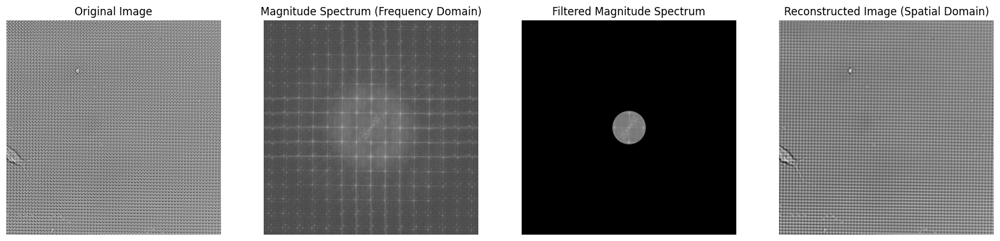

Channel 2


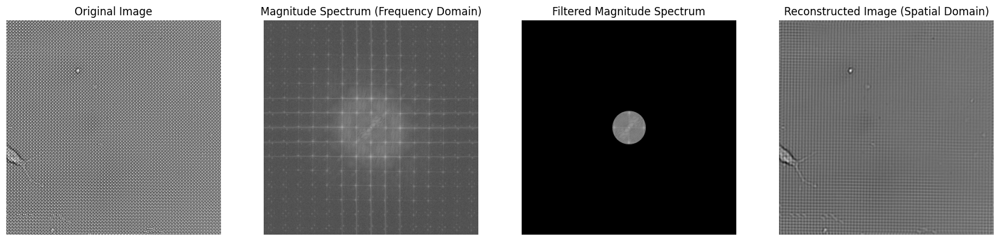

Channel 3


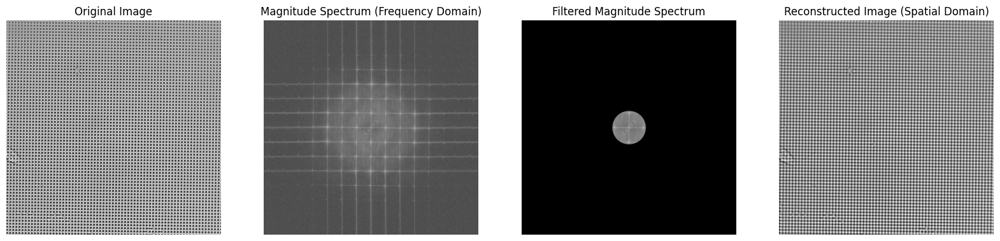

Channel 4


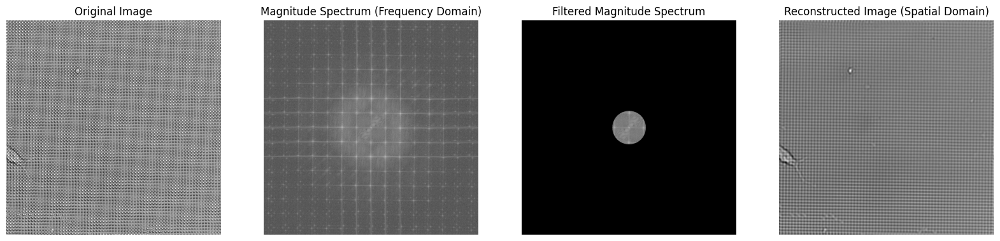

Channel 5


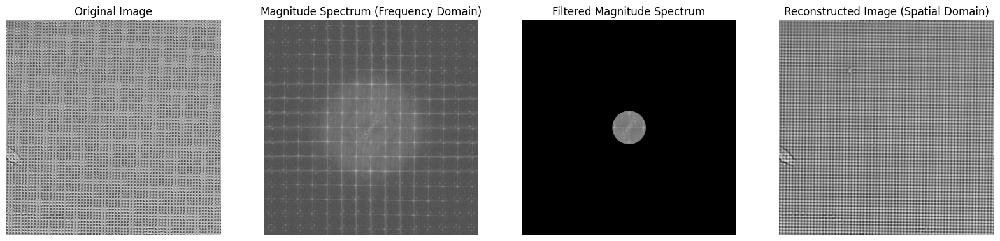

Channel 6


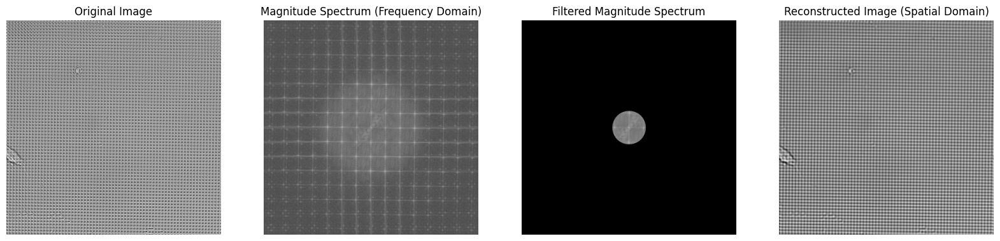

Channel 7


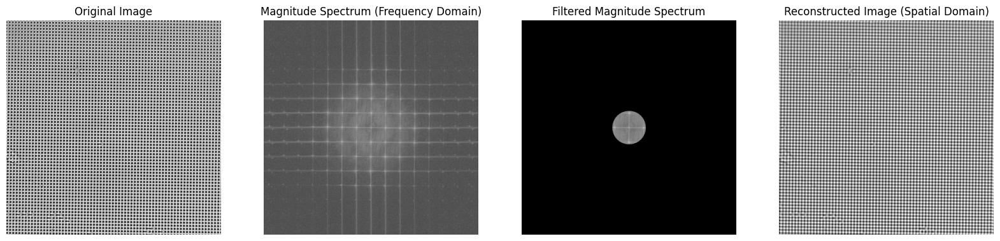

Channel 8


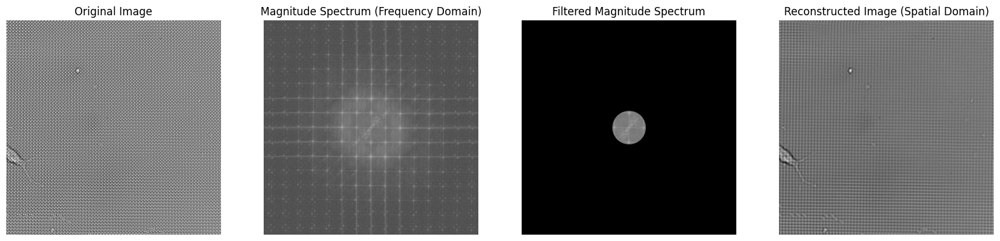

Channel 9


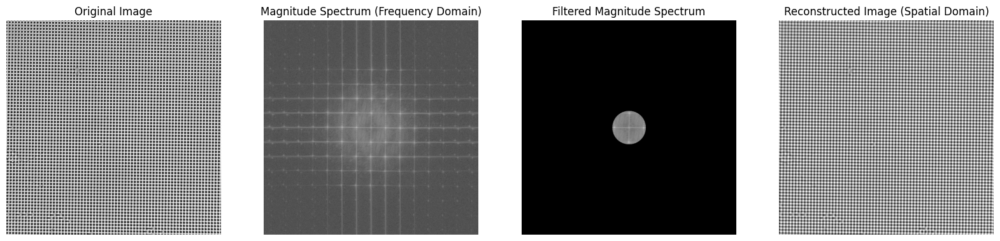

Channel 10


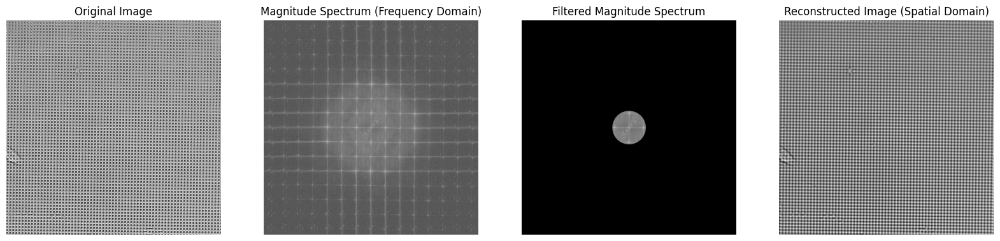

Channel 11


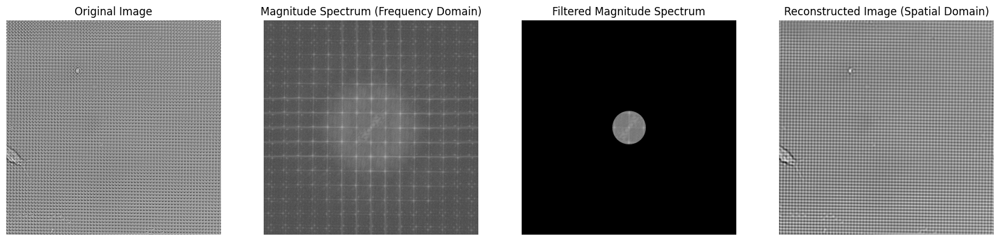

In [73]:
for i, img in enumerate(images):
    print(f"Channel {i+1}")
    img_np, f_magnitude, filtered_magnitude, filtered_img = fft_filter(img)
    plot_fft_filter(img_np, f_magnitude, filtered_magnitude, filtered_img)

In [75]:
# Extract the random image
random_image = imagesb[random_idx].unsqueeze(0).to(device)  # Add batch dimension
random_mask = masks[random_idx].to(device)  # Ground truth mask for the random sample

In [76]:
batch, channels, height, width = random_image.shape

Processing channel 1/11


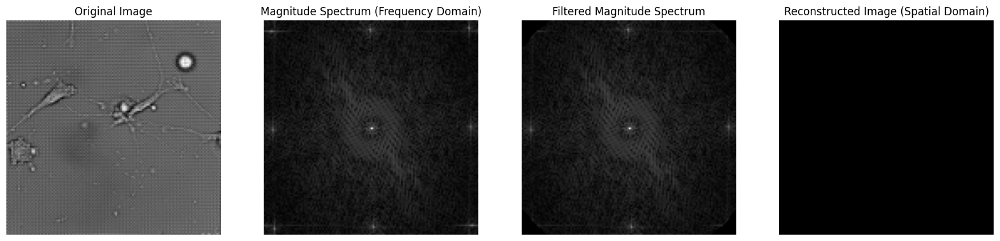

Processing channel 2/11


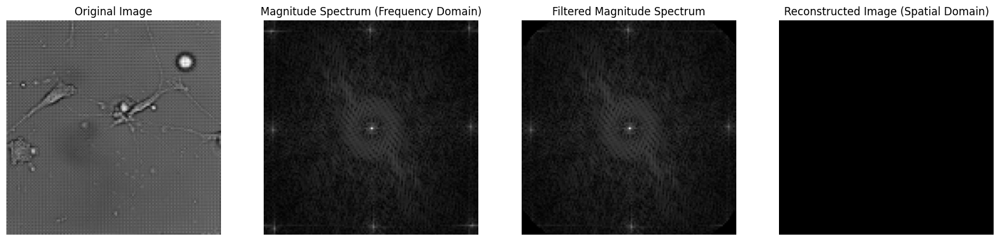

Processing channel 3/11


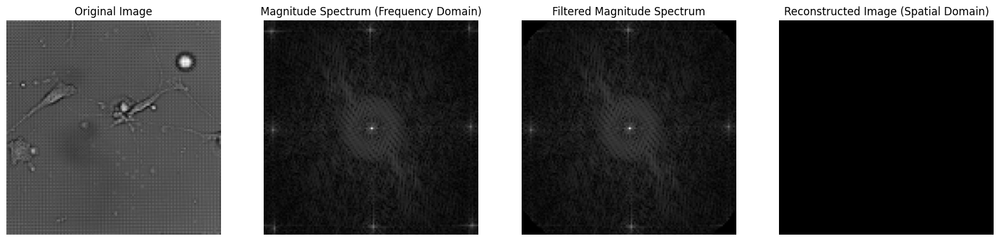

Processing channel 4/11


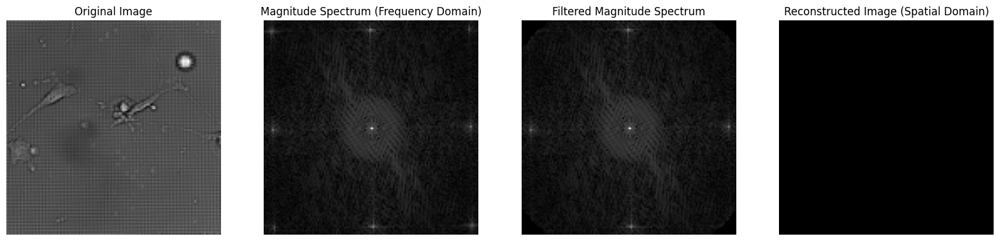

Processing channel 5/11


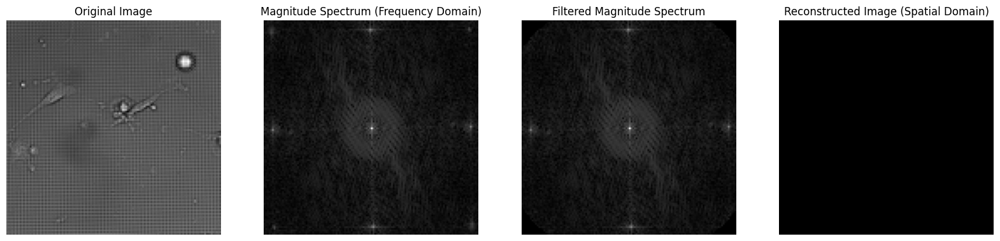

Processing channel 6/11


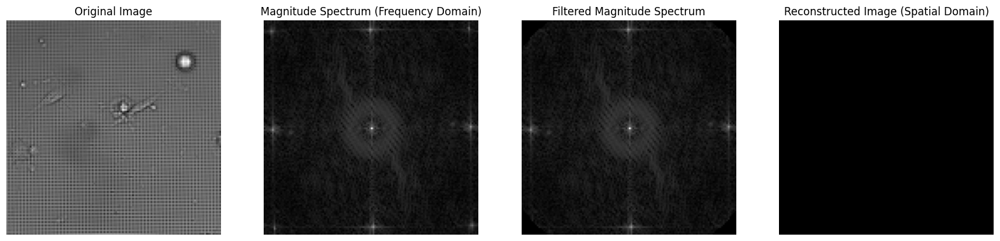

Processing channel 7/11


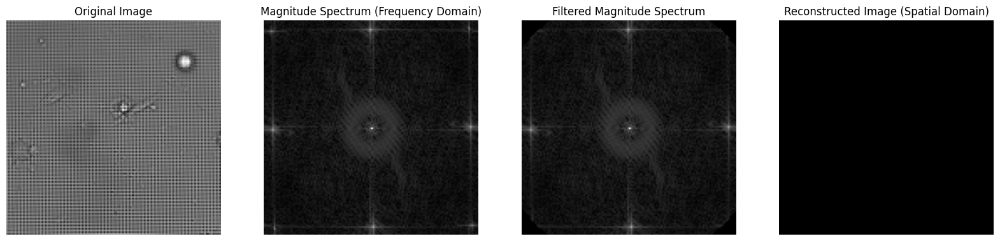

Processing channel 8/11


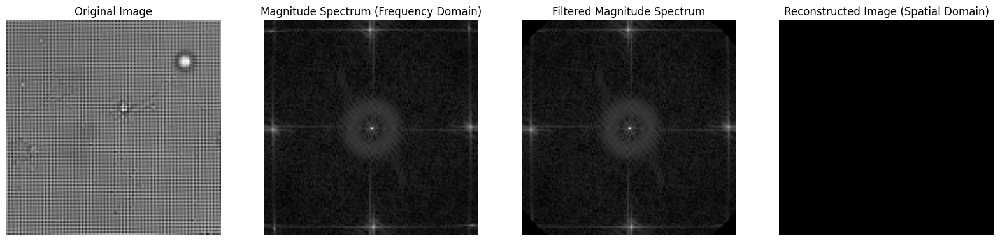

Processing channel 9/11


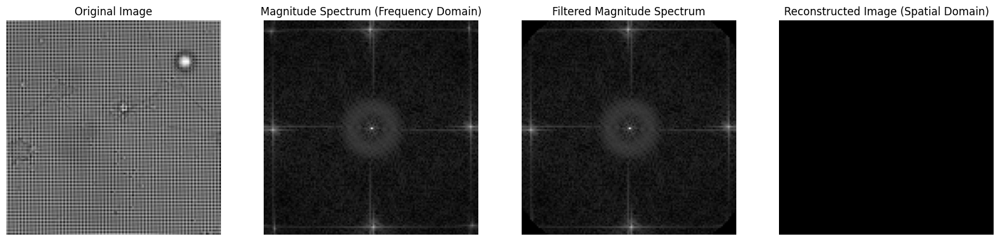

Processing channel 10/11


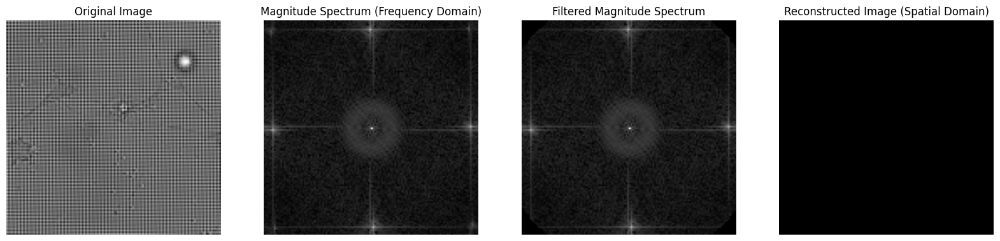

Processing channel 11/11


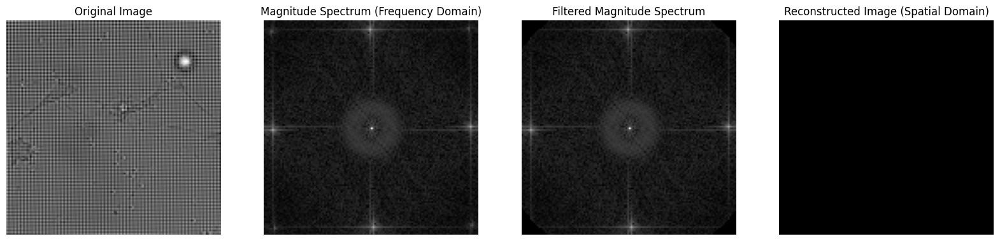

In [77]:
for i in range(channels):
    print(f"Processing channel {i+1}/{channels}")
    
    # Extract the i-th channel
    img_channel = random_image[0, i].cpu() 

    img_np, f_magnitude, filtered_magnitude, filtered_img = fft_filter(img_channel)
    plot_fft_filter(img_np, f_magnitude, filtered_magnitude, filtered_img)